recoding of Kate's H3_5_ref_inputs.ipynb with open-source python

# Add reference input layers and thier attributes to H3_5 hex layer

conda info

```
conda create --name h3 -c conda-forge h3-py numpy pandas geopandas shapely fiona dask matplotlib ipykernel
```

Note: this gets us h3 version 3.7.7 which is no longer maintained. h3 version 4 is still in beta though. Eventually we should switch to h3 version 4 when it is out of beta and python bindings are available through conda. There are major changes including the function name for producing the grid changing from h3.polyfill to h3.polygonToCells

In [1]:
# import packages
# from h3 import h3
import h3
import pandas as pd
import geopandas as gpd
import shapely
import fiona
import dask
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# data locations
#K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3Grid_Inputs.gdb
inputs_gdb=r'C://Users/kerrie/Documents/01_LocalCode/repos/h3_project/data/H3Grid_inputs.gdb'
# counties_shp=r'C://Users/kerrie/Documents/01_LocalCode/repos/h3_project/data/cb_2018_us_county_500k/cb_2018_us_county_500k.shp'

In [ ]:
# constants
# states=['TEXAS','LOUISIANA','MISSISSIPPI','ALABAMA','FLORIDA','GEORGIA']

# Note about h3 projection

h3 uses the geographic crs EPSG:4326 and WGS84 datum. In this crs, the hexagons of each hex size (e.g. 5,6,7,etc) are approximately equal area and the hex centroids are equidistant from neighboring hex centroids. 

It's my understanding that data joined to the hex grid should first be reprojected to the same crs EPSG:4326. And that any calculation on the hex grid should be performed in crs EPSG:4326. 

# Create hex grid

It looks like Kate did this in ArcGIS and exported the grid to a geodatabase. Instead of re-using the hexes from that gdb, I am testing creating the grid with open source python using the tj_2021_us_st_cnt (counties) layer in Kate's gdb.



steps:
- reproject counties to epsg 4326
- create unary union polygon(s) (overall domain boundary)
- create a snake-like line that will slice the overall domain into smaller polygon "chunks" that we can parallelize
- create the hex grid on each polygon chunk in parallel and concatenate the results together

In [ ]:
# layers=fiona.listlayers(inputs_gdb)
# layers

In [38]:
counties=gpd.read_file(inputs_gdb,layer='tj_2021_us_st_cnt')
counties.head()

,STATE_FP,STATE_AB,STATE_NM,COUNTY_FP,CNTY_NAME,GEO_ID,Shape_Length,Shape_Area,geometry
0,48,TX,Texas,327,Menard,48327,238457.030449,3.183344e+09,"MULTIPOLYGON (((-11106479.975 3595247.469, -11..."
1,48,TX,Texas,189,Hale,48189,247069.201615,3.802197e+09,"MULTIPOLYGON (((-11325094.051 4005816.874, -11..."
2,01,AL,Alabama,027,Clay,01027,244308.319067,2.251228e+09,"MULTIPOLYGON (((-9534739.201 3928852.137, -953..."
3,48,TX,Texas,011,Armstrong,48011,237831.037012,3.532396e+09,"MULTIPOLYGON (((-11252985.285 4167562.488, -11..."
4,13,GA,Georgia,189,McDuffie,13189,180661.906160,9.940880e+08,"MULTIPOLYGON (((-9172653.863 3961440.311, -917..."


In [ ]:
counties.crs

<Axes: >

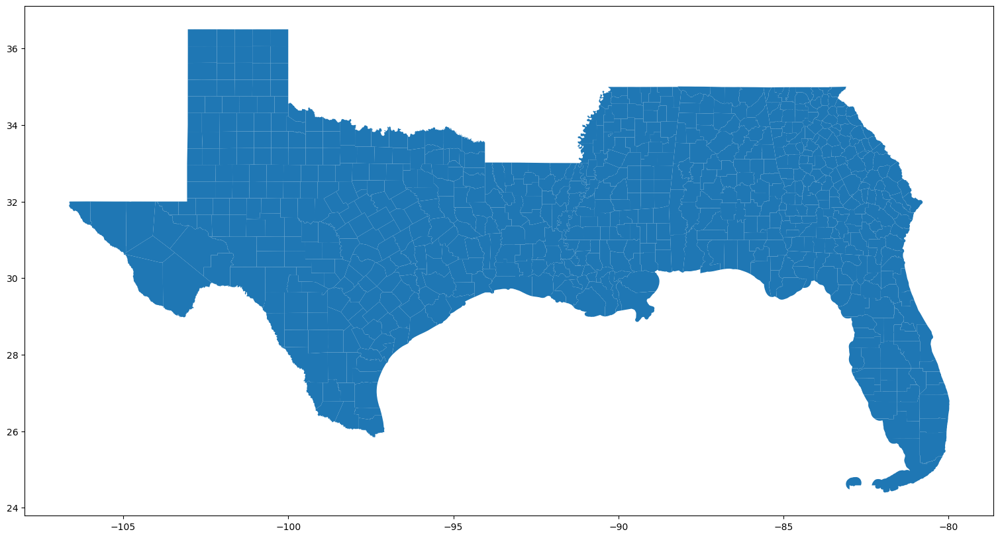

In [39]:
# reprojecting
counties=counties.to_crs("EPSG:4326")
counties.plot(figsize=(20,10))


In [5]:
# unary union of the overall domain

# this unary union actually produces two polygons: 
# the big one and one for the florida keys
region_union=shapely.ops.unary_union(counties.geometry)

# see there are 2 in the list
# to access each polygon it would be region_union.geoms[i]
print(list(region_union.geoms))

# quick view of the polygons
region_union

[<POLYGON ((-97.167 27.563, -97.174 27.55, -97.177 27.545, -97.186 27.527, -9...>, <POLYGON ((-83.032 24.747, -83.021 24.755, -83.013 24.76, -83.005 24.765, -8...>]


polygon min lon, max lon, min lat, max lat -106.64565579307649 -79.97430864405231 24.396312300283807 36.50071011242726
vertical line locations for snake line [-105.76208843562527, -104.37852107817407, -102.99495372072286, -101.61138636327165, -100.22781900582044, -98.84425164836924, -97.46068429091802, -96.07711693346681, -94.69354957601561, -93.3099822185644, -91.92641486111319, -90.54284750366199, -89.15928014621078, -87.77571278875956, -86.39214543130836, -85.00857807385715, -83.62501071640594, -82.24144335895473, -80.85787600150353]


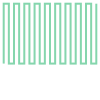

In [6]:
# build a single snake-like line shape that will cut 
# the polygon into strips (for parallelization)
# testing here on just the big polygon, ignoring florida keys

# find the min/max x,y extents of the polygon
poly=region_union.geoms[0]
x,y=poly.exterior.coords.xy
print('polygon min lon, max lon, min lat, max lat',min(x),max(x),min(y),max(y))

# set buffer limits for the snake line
buff_x = 0.5
buff_y=2.
latN=max(y)+buff_y
latS=min(y)-buff_y
lonW=min(x)-buff_x
lonE=max(x)+buff_x

# approximate number of sub polygons to split into
# this is approximate because sometimes jagged coastlines
# will result in a few more sub polygons than nchunks
nchunks=20  

# may have to add an if/error for cases where 
# the number of chunks puts a vertical line in the buffer area
# (meaning a chunk would be in the buffer be fully outside of the polygon)
# x locations for vertical parts of the snake line
xvals=np.linspace(lonW,lonE,nchunks+1)[1:-1].tolist()
print('vertical line locations for snake line',xvals)
# drawing a snake-like line for splitting our polygon
# shapely uses coordinate in the order (x,y)
# starting at the south west side of the polygon
xy_coords=[]
for i,xval in enumerate(xvals):
    if i%2 == 0:
        # points from S to N for every other vertical line
        xy_coords.append([xval,latS])
        xy_coords.append([xval,latN])
    else:
        # points from N to S for every other vertical line
        xy_coords.append([xval,latN])
        xy_coords.append([xval,latS])

# make a line string from all the points
snakeline=shapely.LineString(xy_coords)

# view our creation
snakeline

In [7]:
# split the polygon into strips that don't overlap using our snakeline
# the number of strips/new polygons is approximately equal to nchunks
subpolys=shapely.ops.split(poly,snakeline)

# look at the results
print('number of polygon chunks =',len(subpolys.geoms))
subpolys

number of polygon chunks = 27


now we want to create the h3 grid for each polygon chunk. We'll do this in parallel using a custom function and dask.delayed

In [8]:
def create_h3grid(hexsize,poly,seg_ind):
    # h3 uses coordinates in the order (y,x), the opposite of shapely
    # get polygon coordinates and reverse order to (y,x)

    # shapely.geometry.mapping returns a dictionary of info including
    # the shape type (polygon) and x,y coordinates of the polygon nodes 
    # as a tuple of tuples ((x,y),(x,y),...)
    temp  = shapely.geometry.mapping(poly)
    # now flip the points to (y,x)
    temp['coordinates']=[[ (y,x) for x,y in temp['coordinates'][0] ]]

    # fill polygon with hexes
    hex_list = h3.polyfill(temp,hexsize)
    # hex_list=h3.polygonToCells(temp,hexsize) # v4 coming soon

    # create dataframe with hex id 
    colname='hex{}'.format(hexsize)
    dfh = pd.DataFrame(hex_list,columns=[colname])
    # dfh=dfh.assign(segment_index=seg_ind) # for testing
    assert len(hex_list) == len(dfh.drop_duplicates()), f'error: duplicate hexes found for subpolygon {seg_ind}'

    # add hex center lat lon to the dataframe
    dfh['lat']=dfh[colname].apply(lambda x: h3.h3_to_geo(x)[0])
    dfh['lon']=dfh[colname].apply(lambda x: h3.h3_to_geo(x)[1])

    # create a geopandas geometry column with the hex polygons 
    # (and switch polygon points back to x,y)
    dfh['geometry']=dfh[colname].apply(lambda p: shapely.geometry.Polygon([(x,y) for y,x in h3.h3_to_geo_boundary(p)]))                            

    return dfh

In [10]:
# use dask.delayed to make a list of future computations
# here each task is to create a hex grid for a single polygon chunk in the form of a dataframe
# nothing is computing yet
hexsize=5
task_list=[dask.delayed(create_h3grid)(hexsize,subpoly,i) for i,subpoly in enumerate(subpolys.geoms)]

# should have the same number of tasks as polygon chunks
len(task_list), task_list[0]

(27, Delayed('create_h3grid-e330b6d4-09a2-4052-9110-9a39842729db'))

In [11]:
%%time
# execute all computations in parallel
# the result of each computation (a dataframe) is returned to a list
result_list=dask.compute(*task_list)

# look at the result for a single polygon chunk
result_list[0]

CPU times: total: 797 ms
Wall time: 846 ms


,hex5,lat,lon,geometry
0,8526cb83fffffff,32.617811,-96.718828,POLYGON ((-96.67756938727024 32.52957907001103...
1,8526c87bfffffff,33.089394,-97.147136,POLYGON ((-97.10527499548452 33.00134998673785...
2,85446923fffffff,31.879565,-96.173290,POLYGON ((-96.13284344229523 31.79108877688038...
3,85489a53fffffff,30.956948,-96.662193,POLYGON ((-96.62158284583968 30.86828745745245...
4,854893d7fffffff,28.811590,-96.196070,POLYGON ((-96.15665136373211 28.72258620658811...
...,...,...,...,...
311,85489e57fffffff,29.923335,-96.996399,POLYGON ((-96.95581945630187 29.83450440049679...
312,8526c8affffffff,33.211957,-96.278975,POLYGON ((-96.2379438855438 33.123875189771965...
313,8548b36bfffffff,26.975929,-97.457342,POLYGON ((-97.41731210326027 26.88688359802148...
314,854894b7fffffff,26.873199,-97.312316,POLYGON ((-97.27245707045282 26.78414725114572...


In [101]:
# concatenate the results for all polygon chunks together into a giant dataframe

gdf=gpd.GeoDataFrame(pd.concat(result_list,ignore_index=True))
gdf.set_crs('epsg:4326',inplace=True)
gdf

C:\Users\kerrie\AppData\Local\Temp\ipykernel_3828\3135331709.py:3: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  gdf=gpd.GeoDataFrame(pd.concat(result_list,ignore_index=True))


,hex5,lat,lon,geometry
0,8526cb83fffffff,32.617811,-96.718828,"POLYGON ((-96.67757 32.52958, -96.60910 32.602..."
1,8526c87bfffffff,33.089394,-97.147136,"POLYGON ((-97.10527 33.00135, -97.03663 33.074..."
2,85446923fffffff,31.879565,-96.173290,"POLYGON ((-96.13284 31.79109, -96.06468 31.863..."
3,85489a53fffffff,30.956948,-96.662193,"POLYGON ((-96.62158 30.86829, -96.55408 30.941..."
4,854893d7fffffff,28.811590,-96.196070,"POLYGON ((-96.15665 28.72259, -96.09026 28.796..."
...,...,...,...,...
5373,8544ac63fffffff,26.995399,-80.622030,"POLYGON ((-80.59960 26.90987, -80.53546 26.971..."
5374,8544a8d3fffffff,27.180985,-80.429407,"POLYGON ((-80.40715 27.09551, -80.34297 27.157..."
5375,8544ac57fffffff,26.591330,-80.596502,"POLYGON ((-80.57418 26.50589, -80.51028 26.568..."
5376,8544ae87fffffff,26.706774,-80.146784,"POLYGON ((-80.12493 26.62152, -80.06113 26.683..."


<Axes: >

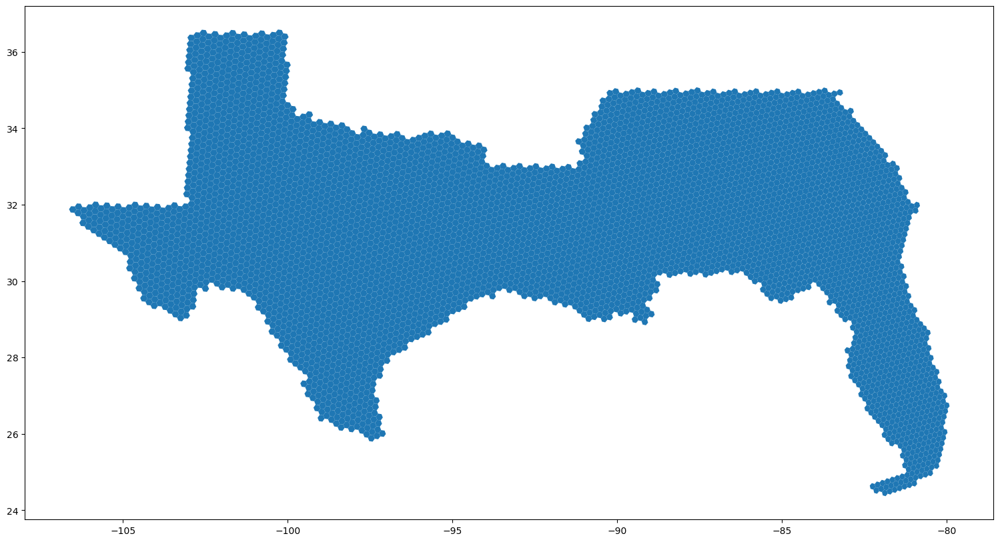

In [64]:
# plot the hexagon grid
# for large number of total hexagons this will take 2+ minutes 
# and you won't even be able to see the hexes because they are so small
# don't plot hexsize > 6, just skip this
gdf.plot(figsize=(20,10))

# Putting data layers on the grid

#### now that we have the grid, put data on it

IMPORTANT: for any data layer, if you want each hexagon to only have 1 data value (for example, a hexagon should be associated with 1 county not 2), you need to join the data to the hexagon centroid (not to the hex polygon)

so geopandas plotting requires the geometry column to be the hex polygons, but joining data layers like counties requires the geometry column to be hex centroid points

Note about geopandas geometry. geopandas recognizes only 1 geometry column at a time. To get the hex centroid as the geometry column but keep the hex polygons (the current geometry column) in the dataframe for later we need to rename the current geometry column to something else and then create a new geometry column of points. 

## county, state info to grid

In [102]:
# rename hex polygons column
# we'll use these again later for plotting
gdf.rename(columns={'geometry':'hex_poly'},inplace=True)

# create new geometry column of hex centroids
gdf['hex_point'] = gpd.points_from_xy(gdf['lon'], gdf['lat'])
gdf['geometry']=gdf['hex_point']

# make sure the crs is set
gdf.set_crs('epsg:4326',inplace=True)
gdf.head()

,hex5,lat,lon,hex_poly,hex_point,geometry
0,8526cb83fffffff,32.617811,-96.718828,"POLYGON ((-96.67757 32.52958, -96.60910 32.602...",POINT (-96.71883 32.61781),POINT (-96.71883 32.61781)
1,8526c87bfffffff,33.089394,-97.147136,"POLYGON ((-97.10527 33.00135, -97.03663 33.074...",POINT (-97.14714 33.08939),POINT (-97.14714 33.08939)
2,85446923fffffff,31.879565,-96.173290,"POLYGON ((-96.13284 31.79109, -96.06468 31.863...",POINT (-96.17329 31.87957),POINT (-96.17329 31.87957)
3,85489a53fffffff,30.956948,-96.662193,"POLYGON ((-96.62158 30.86829, -96.55408 30.941...",POINT (-96.66219 30.95695),POINT (-96.66219 30.95695)
4,854893d7fffffff,28.811590,-96.196070,"POLYGON ((-96.15665 28.72259, -96.09026 28.796...",POINT (-96.19607 28.81159),POINT (-96.19607 28.81159)


In [103]:
# do the data join
gdf = gpd.tools.sjoin(gdf, counties, how="left").drop('index_right',axis=1)
gdf.rename(columns={'Shape_Length':'Shape_Length_CNTY','Shape_Area':'Shape_Area_CNTY'},inplace=True)
gdf.head()

,hex5,lat,lon,hex_poly,hex_point,geometry,STATE_FP,STATE_AB,STATE_NM,COUNTY_FP,CNTY_NAME,GEO_ID,Shape_Length_CNTY,Shape_Area_CNTY
0,8526cb83fffffff,32.617811,-96.718828,"POLYGON ((-96.67757 32.52958, -96.60910 32.602...",POINT (-96.71883 32.61781),POINT (-96.71883 32.61781),48,TX,Texas,113,Dallas,48113,231041.969104,3.337223e+09
1,8526c87bfffffff,33.089394,-97.147136,"POLYGON ((-97.10527 33.00135, -97.03663 33.074...",POINT (-97.14714 33.08939),POINT (-97.14714 33.08939),48,TX,Texas,121,Denton,48121,238141.676947,3.530231e+09
2,85446923fffffff,31.879565,-96.173290,"POLYGON ((-96.13284 31.79109, -96.06468 31.863...",POINT (-96.17329 31.87957),POINT (-96.17329 31.87957),48,TX,Texas,161,Freestone,48161,298707.610715,3.201482e+09
3,85489a53fffffff,30.956948,-96.662193,"POLYGON ((-96.62158 30.86829, -96.55408 30.941...",POINT (-96.66219 30.95695),POINT (-96.66219 30.95695),48,TX,Texas,395,Robertson,48395,302750.437579,3.063084e+09
4,854893d7fffffff,28.811590,-96.196070,"POLYGON ((-96.15665 28.72259, -96.09026 28.796...",POINT (-96.19607 28.81159),POINT (-96.19607 28.81159),48,TX,Texas,321,Matagorda,48321,381125.354824,5.456873e+09


if we want to plot again, we need to move the hex centroid points out of the geometry column and move the hex polygons back into the geometry column

In [104]:
# switching geometry from hex points back to hex polygons for plotting
gdf['geometry']=gdf['hex_poly']
print(gdf.shape)
gdf.head()

(5378, 14)


,hex5,lat,lon,hex_poly,hex_point,geometry,STATE_FP,STATE_AB,STATE_NM,COUNTY_FP,CNTY_NAME,GEO_ID,Shape_Length_CNTY,Shape_Area_CNTY
0,8526cb83fffffff,32.617811,-96.718828,"POLYGON ((-96.67757 32.52958, -96.60910 32.602...",POINT (-96.71883 32.61781),"POLYGON ((-96.67757 32.52958, -96.60910 32.602...",48,TX,Texas,113,Dallas,48113,231041.969104,3.337223e+09
1,8526c87bfffffff,33.089394,-97.147136,"POLYGON ((-97.10527 33.00135, -97.03663 33.074...",POINT (-97.14714 33.08939),"POLYGON ((-97.10527 33.00135, -97.03663 33.074...",48,TX,Texas,121,Denton,48121,238141.676947,3.530231e+09
2,85446923fffffff,31.879565,-96.173290,"POLYGON ((-96.13284 31.79109, -96.06468 31.863...",POINT (-96.17329 31.87957),"POLYGON ((-96.13284 31.79109, -96.06468 31.863...",48,TX,Texas,161,Freestone,48161,298707.610715,3.201482e+09
3,85489a53fffffff,30.956948,-96.662193,"POLYGON ((-96.62158 30.86829, -96.55408 30.941...",POINT (-96.66219 30.95695),"POLYGON ((-96.62158 30.86829, -96.55408 30.941...",48,TX,Texas,395,Robertson,48395,302750.437579,3.063084e+09
4,854893d7fffffff,28.811590,-96.196070,"POLYGON ((-96.15665 28.72259, -96.09026 28.796...",POINT (-96.19607 28.81159),"POLYGON ((-96.15665 28.72259, -96.09026 28.796...",48,TX,Texas,321,Matagorda,48321,381125.354824,5.456873e+09


<Axes: >

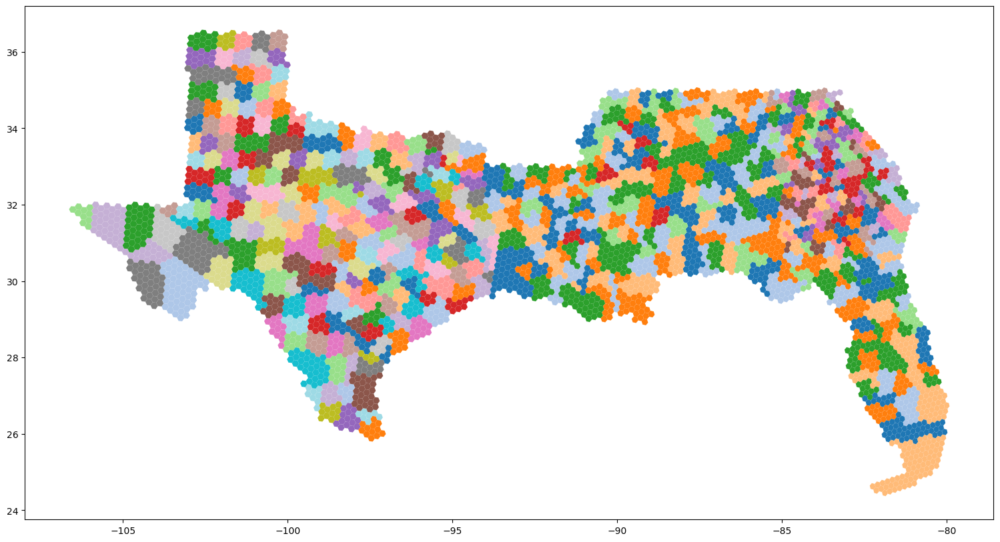

In [105]:
# plot the data on the hex grid

# remember, skip this if hexsize > 6 
# or be prepared to wait forever for an underwhelming visual

gdf.plot("COUNTY_FP",figsize=(20,10),cmap='tab20')

<Axes: >

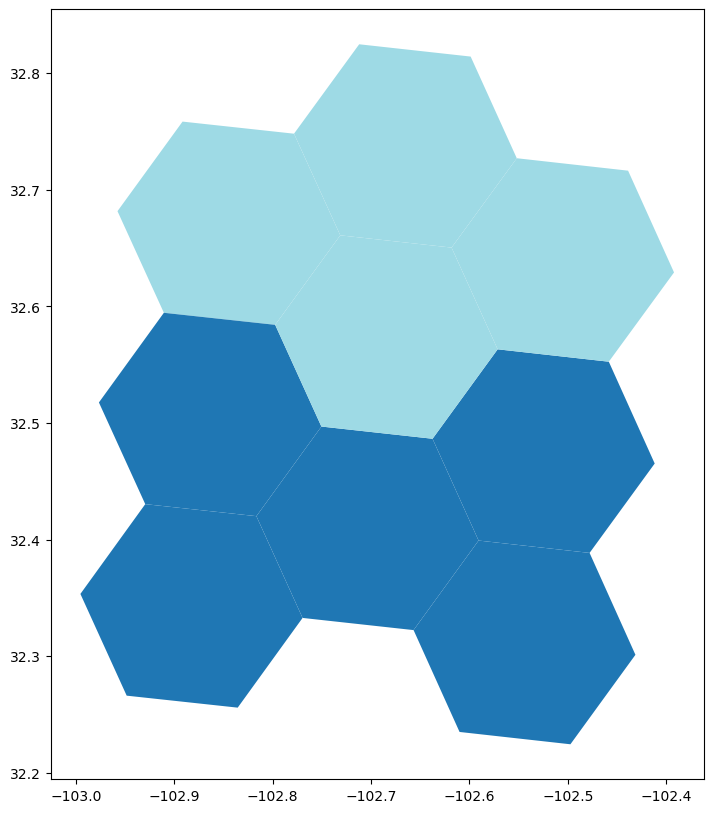

In [106]:
# plot a subset of the grid
# this should work for any hexsize

subset=gdf[(gdf['lon']>-103)&(gdf['lon']<-102.5)&(gdf['lat']>32.25)&(gdf['lat']<32.75)]
subset.plot("COUNTY_FP",figsize=(20,10),cmap='tab20')

## estuarine drainage areas to grid

In [107]:
drain_areas=gpd.read_file(inputs_gdb,layer='Estuarine_Drainage_Areas')
print(drain_areas.crs)
drain_areas.head()

EPSG:3857


,Shape_Length,Shape_Area,EDA_ID,EDA_NAME,geometry
0,424946.905561,4.270727e+09,98,Caloosahatchee,"MULTIPOLYGON (((-9030446.189 3110160.016, -903..."
1,348547.656184,4.479931e+09,96,Sarasota Bay - Lemon Bay EDA,"MULTIPOLYGON (((-9210796.947 3191164.701, -921..."
2,556244.084069,9.130676e+09,95,Tampa Bay EDA,"MULTIPOLYGON (((-9158525.910 3300433.229, -915..."
3,578697.381160,9.802847e+09,94,Crystal - Pithlachascotee EDA,"MULTIPOLYGON (((-9186003.323 3376339.141, -918..."
4,649047.892267,6.824983e+09,93,Withlachoochee EDA,"MULTIPOLYGON (((-9135058.044 3399176.006, -913..."


In [108]:
# reproject
drain_areas=drain_areas.to_crs('epsg:4326')

# make hex centroid points the geometry column
gdf['geometry']=gdf['hex_point']

# join data and add suffix to some columns
gdf = gpd.tools.sjoin(gdf, drain_areas, how="left").drop('index_right',axis=1)
gdf.rename(columns={'Shape_Length':'Shape_Length_EDA','Shape_Area':'Shape_Area_EDA'},inplace=True)
gdf.head()

,hex5,lat,lon,hex_poly,hex_point,geometry,STATE_FP,STATE_AB,STATE_NM,COUNTY_FP,CNTY_NAME,GEO_ID,Shape_Length_CNTY,Shape_Area_CNTY,Shape_Length_EDA,Shape_Area_EDA,EDA_ID,EDA_NAME
0,8526cb83fffffff,32.617811,-96.718828,"POLYGON ((-96.67757 32.52958, -96.60910 32.602...",POINT (-96.71883 32.61781),POINT (-96.71883 32.61781),48,TX,Texas,113,Dallas,48113,231041.969104,3.337223e+09,NaN,NaN,NaN,NaN
1,8526c87bfffffff,33.089394,-97.147136,"POLYGON ((-97.10527 33.00135, -97.03663 33.074...",POINT (-97.14714 33.08939),POINT (-97.14714 33.08939),48,TX,Texas,121,Denton,48121,238141.676947,3.530231e+09,NaN,NaN,NaN,NaN
2,85446923fffffff,31.879565,-96.173290,"POLYGON ((-96.13284 31.79109, -96.06468 31.863...",POINT (-96.17329 31.87957),POINT (-96.17329 31.87957),48,TX,Texas,161,Freestone,48161,298707.610715,3.201482e+09,NaN,NaN,NaN,NaN
3,85489a53fffffff,30.956948,-96.662193,"POLYGON ((-96.62158 30.86829, -96.55408 30.941...",POINT (-96.66219 30.95695),POINT (-96.66219 30.95695),48,TX,Texas,395,Robertson,48395,302750.437579,3.063084e+09,NaN,NaN,NaN,NaN
4,854893d7fffffff,28.811590,-96.196070,"POLYGON ((-96.15665 28.72259, -96.09026 28.796...",POINT (-96.19607 28.81159),POINT (-96.19607 28.81159),48,TX,Texas,321,Matagorda,48321,381125.354824,5.456873e+09,674405.998451,2.263545e+10,69,Matagorda Bay EDA


<Axes: >

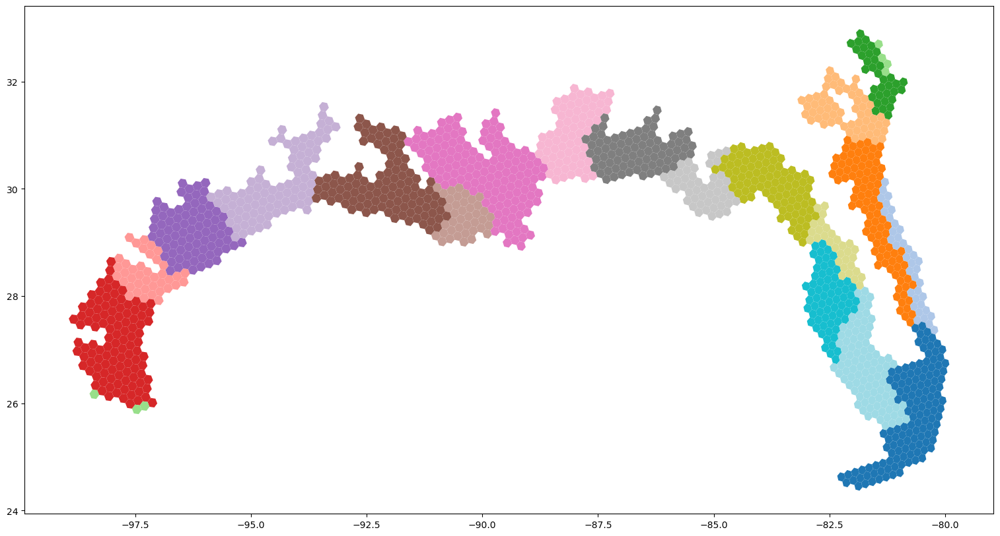

In [109]:
# plot the data on the hex grid

# remember, skip this if hexsize > 6 
# or be prepared to wait forever for an underwhelming visual

gdf['geometry']=gdf['hex_poly']
gdf.plot("EDA_ID",figsize=(20,10),cmap='tab20')

## HUC8 codes

try geopandas dask here

In [110]:
huc8=gpd.read_file(inputs_gdb,layer='WBDHU8')
print(huc8.crs)
huc8.head()

EPSG:3857


,HUC_8,Shape_Length,Shape_Area,geometry
0,17110002,25944.437256,2.697823e+07,"MULTIPOLYGON (((-13695092.319 6271421.047, -13..."
1,17110002,170965.521353,5.356096e+08,"MULTIPOLYGON (((-13660041.690 6238783.587, -13..."
2,17110004,566104.244892,4.709615e+09,"MULTIPOLYGON (((-13583731.183 6273600.767, -13..."
3,17110001,104766.812477,4.209640e+08,"MULTIPOLYGON (((-13596187.417 6275270.857, -13..."
4,17110001,239933.177382,1.030621e+09,"MULTIPOLYGON (((-13583731.183 6273600.767, -13..."


In [111]:
# reproject
huc8=huc8.to_crs('epsg:4326')

# make hex centroid points the geometry column
gdf['geometry']=gdf['hex_point']

# join data and add suffix to some columns
gdf = gpd.tools.sjoin(gdf, huc8, how="left").drop('index_right',axis=1)
gdf.rename(columns={'Shape_Length':'Shape_Length_HUC8','Shape_Area':'Shape_Area_HUC8'},inplace=True)
gdf.head()

,hex5,lat,lon,hex_poly,hex_point,geometry,STATE_FP,STATE_AB,STATE_NM,COUNTY_FP,...,GEO_ID,Shape_Length_CNTY,Shape_Area_CNTY,Shape_Length_EDA,Shape_Area_EDA,EDA_ID,EDA_NAME,HUC_8,Shape_Length_HUC8,Shape_Area_HUC8
0,8526cb83fffffff,32.617811,-96.718828,"POLYGON ((-96.67757 32.52958, -96.60910 32.602...",POINT (-96.71883 32.61781),POINT (-96.71883 32.61781),48,TX,Texas,113,...,48113,231041.969104,3.337223e+09,NaN,NaN,NaN,NaN,12030105,605650.834922,4.998808e+09
1,8526c87bfffffff,33.089394,-97.147136,"POLYGON ((-97.10527 33.00135, -97.03663 33.074...",POINT (-97.14714 33.08939),POINT (-97.14714 33.08939),48,TX,Texas,121,...,48121,238141.676947,3.530231e+09,NaN,NaN,NaN,NaN,12030103,514263.709712,6.919259e+09
2,85446923fffffff,31.879565,-96.173290,"POLYGON ((-96.13284 31.79109, -96.06468 31.863...",POINT (-96.17329 31.87957),POINT (-96.17329 31.87957),48,TX,Texas,161,...,48161,298707.610715,3.201482e+09,NaN,NaN,NaN,NaN,12030201,585401.814868,7.556089e+09
3,85489a53fffffff,30.956948,-96.662193,"POLYGON ((-96.62158 30.86829, -96.55408 30.941...",POINT (-96.66219 30.95695),POINT (-96.66219 30.95695),48,TX,Texas,395,...,48395,302750.437579,3.063084e+09,NaN,NaN,NaN,NaN,12070101,899989.453493,9.521164e+09
4,854893d7fffffff,28.811590,-96.196070,"POLYGON ((-96.15665 28.72259, -96.09026 28.796...",POINT (-96.19607 28.81159),POINT (-96.19607 28.81159),48,TX,Texas,321,...,48321,381125.354824,5.456873e+09,674405.998451,2.263545e+10,69,Matagorda Bay EDA,12100401,345704.398821,4.326344e+09


<Axes: >

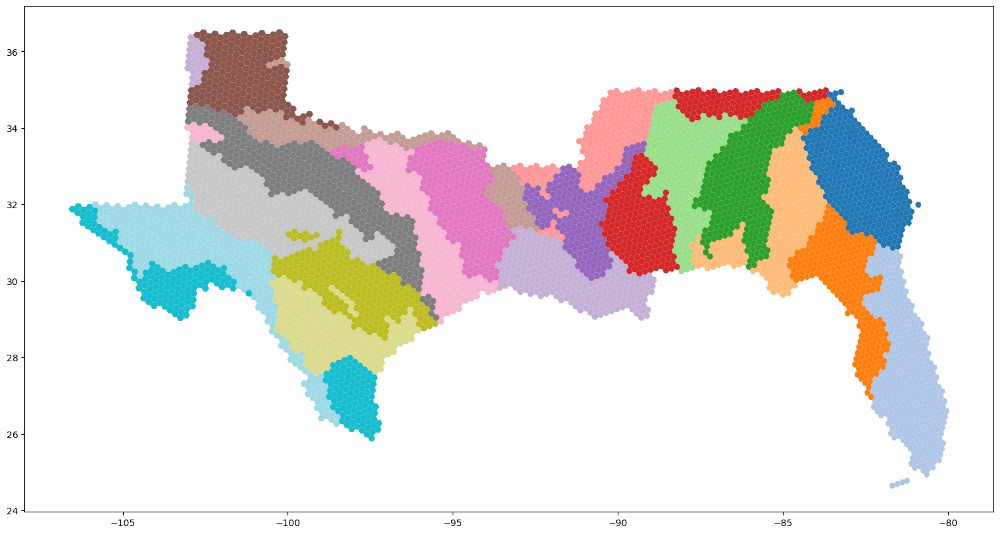

In [112]:
# plot the data on the hex grid

# remember, skip this if hexsize > 6 
# or be prepared to wait forever for an underwhelming visual

gdf['geometry']=gdf['hex_poly']
gdf.plot("HUC_8",figsize=(20,10),cmap='tab20')

## HUC12 codes

In [113]:
huc12=gpd.read_file(inputs_gdb,layer='WBDHU12')
print(huc12.crs)
huc12.head()

EPSG:3857


,HUC_12,Shape_Length,Shape_Area,geometry
0,030701040701,66776.438596,1.750601e+08,"MULTIPOLYGON (((-9238467.963 3760701.560, -923..."
1,030701040506,78766.277817,1.629847e+08,"MULTIPOLYGON (((-9255053.443 3775064.593, -925..."
2,030701040603,94342.695085,2.768034e+08,"MULTIPOLYGON (((-9255670.267 3766386.576, -925..."
3,030701040702,83937.299717,2.064614e+08,"MULTIPOLYGON (((-9234856.070 3760812.129, -923..."
4,030701040804,104233.316753,3.304540e+08,"MULTIPOLYGON (((-9233863.154 3743110.616, -923..."


In [114]:
huc12=huc12.to_crs('epsg:4326')

gdf['geometry']=gdf['hex_point']

gdf = gpd.tools.sjoin(gdf, huc12, how="left").drop('index_right',axis=1)
gdf.rename(columns={'Shape_Length':'Shape_Length_HUC12','Shape_Area':'Shape_Area_HUC12'},inplace=True)

gdf.head()

,hex5,lat,lon,hex_poly,hex_point,geometry,STATE_FP,STATE_AB,STATE_NM,COUNTY_FP,...,Shape_Length_EDA,Shape_Area_EDA,EDA_ID,EDA_NAME,HUC_8,Shape_Length_HUC8,Shape_Area_HUC8,HUC_12,Shape_Length_HUC12,Shape_Area_HUC12
0,8526cb83fffffff,32.617811,-96.718828,"POLYGON ((-96.67757 32.52958, -96.60910 32.602...",POINT (-96.71883 32.61781),POINT (-96.71883 32.61781),48,TX,Texas,113,...,NaN,NaN,NaN,NaN,12030105,605650.834922,4.998808e+09,120301050203,96436.012713,2.123434e+08
1,8526c87bfffffff,33.089394,-97.147136,"POLYGON ((-97.10527 33.00135, -97.03663 33.074...",POINT (-97.14714 33.08939),POINT (-97.14714 33.08939),48,TX,Texas,121,...,NaN,NaN,NaN,NaN,12030103,514263.709712,6.919259e+09,120301030804,68043.936302,1.572156e+08
2,85446923fffffff,31.879565,-96.173290,"POLYGON ((-96.13284 31.79109, -96.06468 31.863...",POINT (-96.17329 31.87957),POINT (-96.17329 31.87957),48,TX,Texas,161,...,NaN,NaN,NaN,NaN,12030201,585401.814868,7.556089e+09,120302010108,80798.338197,1.884790e+08
3,85489a53fffffff,30.956948,-96.662193,"POLYGON ((-96.62158 30.86829, -96.55408 30.941...",POINT (-96.66219 30.95695),POINT (-96.66219 30.95695),48,TX,Texas,395,...,NaN,NaN,NaN,NaN,12070101,899989.453493,9.521164e+09,120701010601,41489.034642,5.789542e+07
4,854893d7fffffff,28.811590,-96.196070,"POLYGON ((-96.15665 28.72259, -96.09026 28.796...",POINT (-96.19607 28.81159),POINT (-96.19607 28.81159),48,TX,Texas,321,...,674405.998451,2.263545e+10,69,Matagorda Bay EDA,12100401,345704.398821,4.326344e+09,121004010300,303539.396994,1.244854e+09


<Axes: >

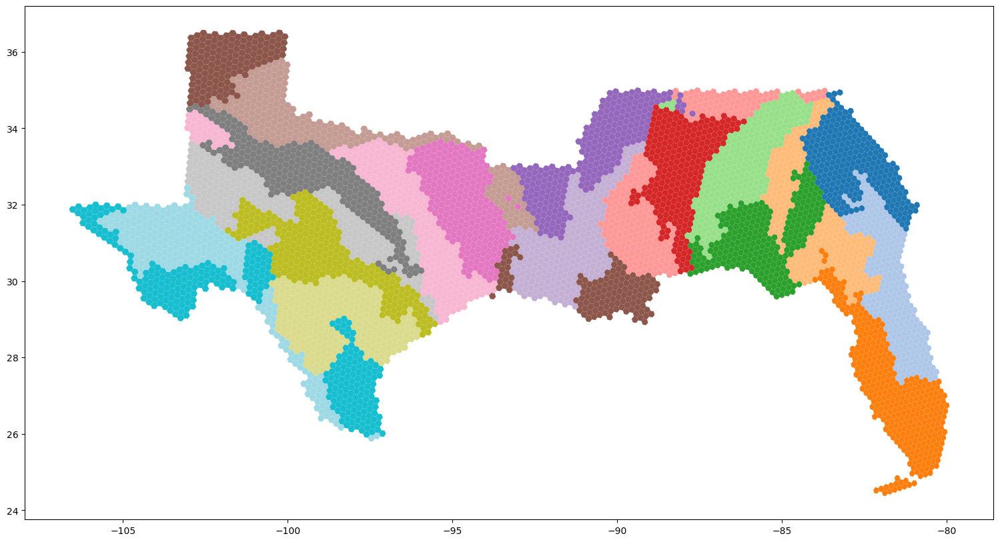

In [115]:
# plot the data on the hex grid

# remember, skip this if hexsize > 6 
# or be prepared to wait forever for an underwhelming visual

gdf['geometry']=gdf['hex_poly']
gdf.plot("HUC_12",figsize=(20,10),cmap='tab20')

## pop density and land/water to hexes

In [116]:
census=gpd.read_file(inputs_gdb,layer='dtl_cnty_Census_ESRI')
print(census.crs)
census.head()

EPSG:3857


,POP_SQMI,Shape_Length,Shape_Area,FIPS_Lnd_Wtr,geometry
0,97.3,2.499697e+05,2.208591e+09,01001_Land,"MULTIPOLYGON (((-9619464.597 3856529.258, -961..."
1,141.9,1.108480e+06,5.744027e+09,01003_Land,"MULTIPOLYGON (((-9747680.970 3539801.334, -974..."
2,27.9,3.208826e+05,3.257908e+09,01005_Land,"MULTIPOLYGON (((-9490859.154 3782745.369, -949..."
3,35.6,2.279198e+05,2.311978e+09,01007_Land,"MULTIPOLYGON (((-9692114.170 3928123.612, -969..."
4,90.9,2.926199e+05,2.456905e+09,01009_Land,"MULTIPOLYGON (((-9623906.701 4063676.211, -962..."


In [117]:
census=census.to_crs('epsg:4326')

gdf['geometry']=gdf['hex_point']

gdf = gpd.tools.sjoin(gdf, census, how="left").drop('index_right',axis=1)
gdf.rename(columns={'Shape_Length':'Shape_Length_CENS','Shape_Area':'Shape_Area_CENS'},inplace=True)

gdf.head()

,hex5,lat,lon,hex_poly,hex_point,geometry,STATE_FP,STATE_AB,STATE_NM,COUNTY_FP,...,HUC_8,Shape_Length_HUC8,Shape_Area_HUC8,HUC_12,Shape_Length_HUC12,Shape_Area_HUC12,POP_SQMI,Shape_Length_CENS,Shape_Area_CENS,FIPS_Lnd_Wtr
0,8526cb83fffffff,32.617811,-96.718828,"POLYGON ((-96.67757 32.52958, -96.60910 32.602...",POINT (-96.71883 32.61781),POINT (-96.71883 32.61781),48,TX,Texas,113,...,12030105,605650.834922,4.998808e+09,120301050203,96436.012713,2.123434e+08,2876.6,2.310417e+05,3.337224e+09,48113_Land
1,8526c87bfffffff,33.089394,-97.147136,"POLYGON ((-97.10527 33.00135, -97.03663 33.074...",POINT (-97.14714 33.08939),POINT (-97.14714 33.08939),48,TX,Texas,121,...,12030103,514263.709712,6.919259e+09,120301030804,68043.936302,1.572156e+08,952.5,2.381412e+05,3.530232e+09,48121_Land
2,85446923fffffff,31.879565,-96.173290,"POLYGON ((-96.13284 31.79109, -96.06468 31.863...",POINT (-96.17329 31.87957),POINT (-96.17329 31.87957),48,TX,Texas,161,...,12030201,585401.814868,7.556089e+09,120302010108,80798.338197,1.884790e+08,21.8,2.987074e+05,3.201480e+09,48161_Land
3,85489a53fffffff,30.956948,-96.662193,"POLYGON ((-96.62158 30.86829, -96.55408 30.941...",POINT (-96.66219 30.95695),POINT (-96.66219 30.95695),48,TX,Texas,395,...,12070101,899989.453493,9.521164e+09,120701010601,41489.034642,5.789542e+07,19.4,3.027498e+05,3.063086e+09,48395_Land
4,854893d7fffffff,28.811590,-96.196070,"POLYGON ((-96.15665 28.72259, -96.09026 28.796...",POINT (-96.19607 28.81159),POINT (-96.19607 28.81159),48,TX,Texas,321,...,12100401,345704.398821,4.326344e+09,121004010300,303539.396994,1.244854e+09,32.2,1.459787e+06,3.814397e+09,48321_Land


<Axes: >

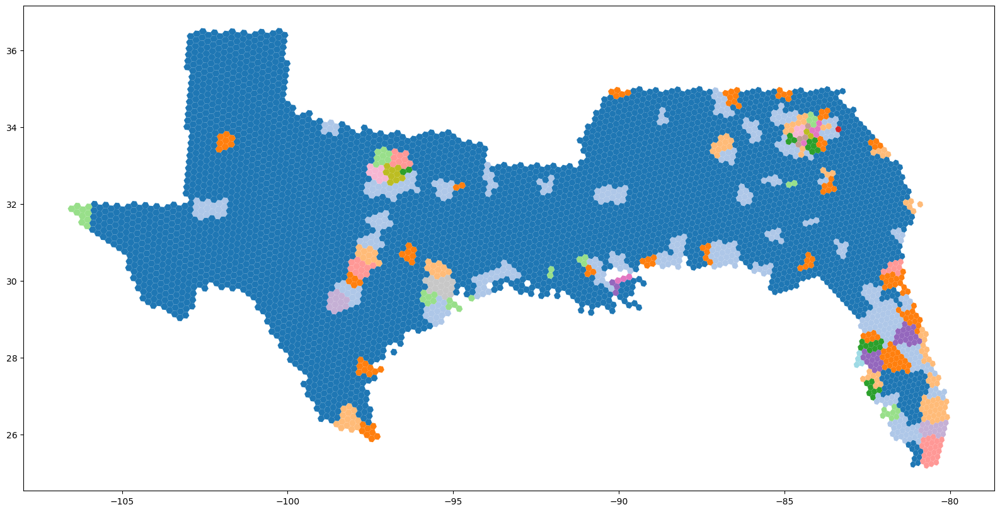

In [118]:
# plot the data on the hex grid

# remember, skip this if hexsize > 6 
# or be prepared to wait forever for an underwhelming visual

gdf['geometry']=gdf['hex_poly']
gdf.plot("POP_SQMI",figsize=(20,10),cmap='tab20')

<Axes: >

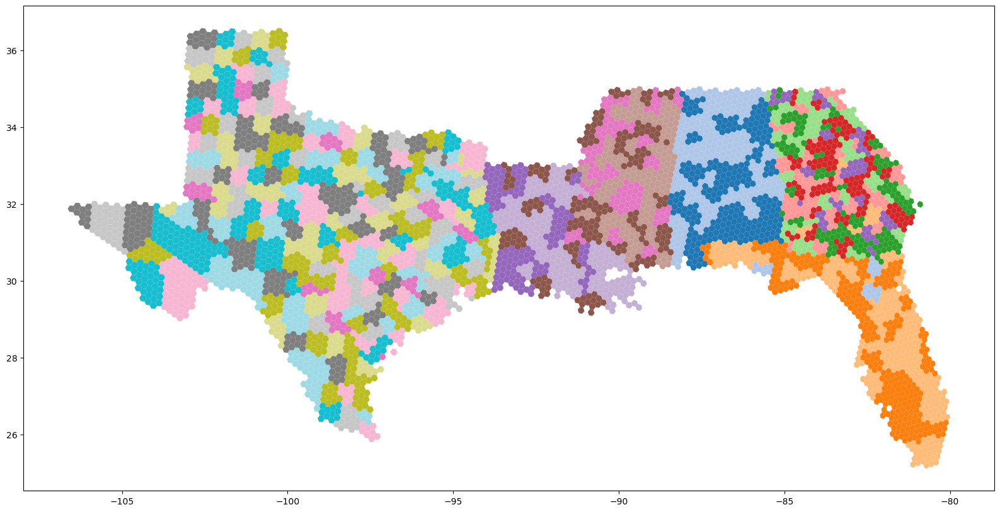

In [119]:
gdf.plot("FIPS_Lnd_Wtr",figsize=(20,10),cmap='tab20')

# Make a function 

### area data (polygon/multipolygons) to hex grid using hex centroids

We are essentially doing the same thing for each data layer to get it onto the hex grid, so we can make a function for this. The function will take the hex grid and information about the data layer and put the data on the grid.

This function will not apply to different types of input data like point data or possibly gridded data. For that we will need to make a different function.

Let's start with a clean geodataframe of the hexgrid for our full domain

In [137]:
# concatenate the results for all polygon chunks together into a giant dataframe
gdf=gpd.GeoDataFrame(pd.concat(result_list,ignore_index=True))
gdf.set_crs('epsg:4326',inplace=True)

# set up the polygons and points in separate columns
# and make geometry column points
gdf['hex_poly']=gdf['geometry']
gdf['hex_point'] = gpd.points_from_xy(gdf['lon'], gdf['lat'])
gdf['geometry']=gdf['hex_point']
gdf.columns

Index(['hex5', 'lat', 'lon', 'geometry', 'hex_poly', 'hex_point', 'STATE_FP',
       'STATE_AB', 'STATE_NM', 'COUNTY_FP', 'CNTY_NAME', 'GEO_ID', 'EDA_ID',
       'EDA_NAME', 'HUC_8', 'HUC_12', 'POP_SQMI', 'FIPS_Lnd_Wtr'],
      dtype='object')

In [128]:
def area_data_to_hexes(gdf,gdb_layer_name):
    '''
    inputs:
    gdf :: geodataframe, contains at minimum hex id's 
            and a geometry column containing hex centroid points
    gdb_layer_name :: string, the exact name of the data layer in Kate's gdb

    returns:
    gdf :: the original gdf that now also contains the gdb 
            data layer interpolated onto the hexes
    '''
    
    # load data layer to geodataframe
    data_df=gpd.read_file(inputs_gdb,layer=gdb_layer_name)
    
    # reproject
    if data_df.crs != 'EPSG:4326': 
        data_df = data_df.to_crs('EPSG:4326')
    
    # join
    gdf = gpd.tools.sjoin(gdf, data_df, how="left").drop(['index_right','Shape_Length','Shape_Area'],axis=1)
    return gdf


In [122]:
gdb_layer_inputs = ['tj_2021_us_st_cnt',
                    'Estuarine_Drainage_Areas',
                    'WBDHU8',
                    'WBDHU12',
                    'dtl_cnty_Census_ESRI']

field_names = ['COUNTY_FP','STATE_FP','EDA_ID','HUC_8',
               'HUC_12','POP_SQMI','FIPS_Lnd_Wtr']

In [130]:
%%time
# no parallelization, ~48s
for layer in gdb_layer_inputs:
    print('processing',layer)
    gdf = area_data_to_hexes(gdf,layer)

CPU times: total: 47.3 s
Wall time: 47.6 s


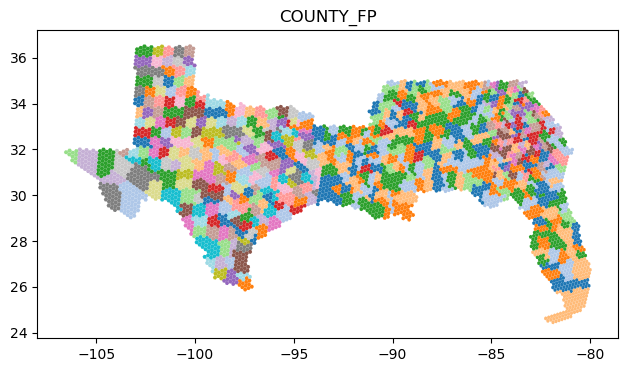

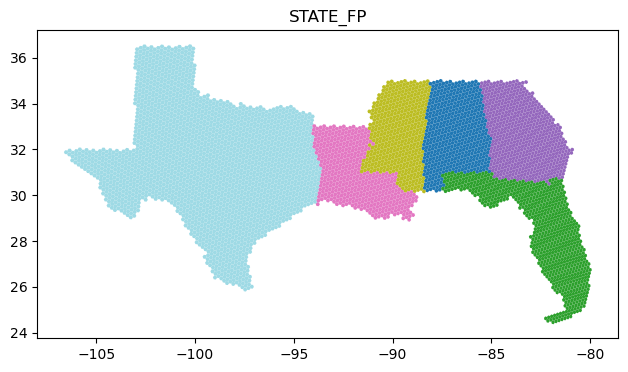

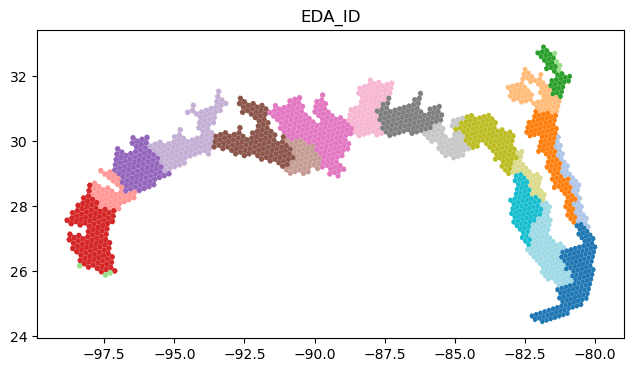

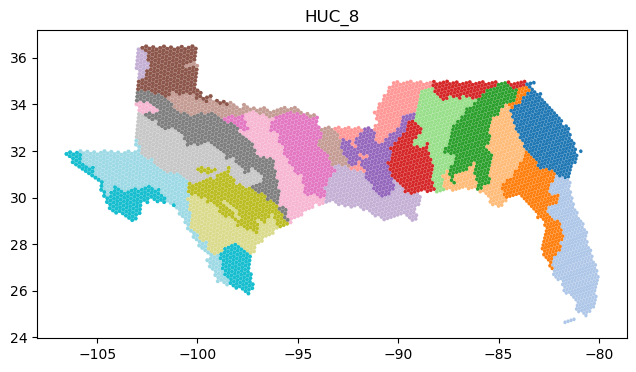

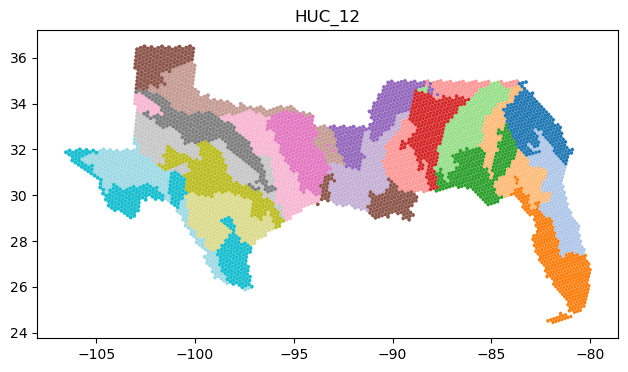

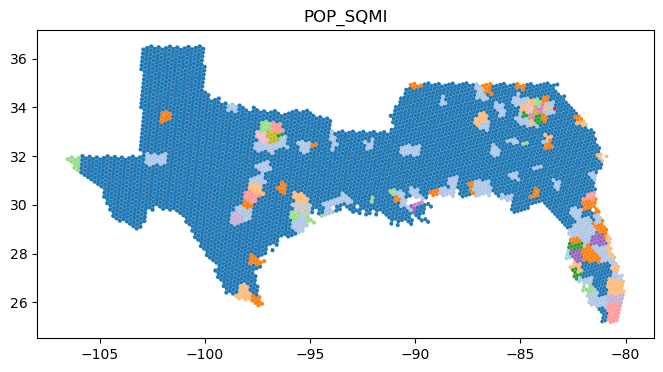

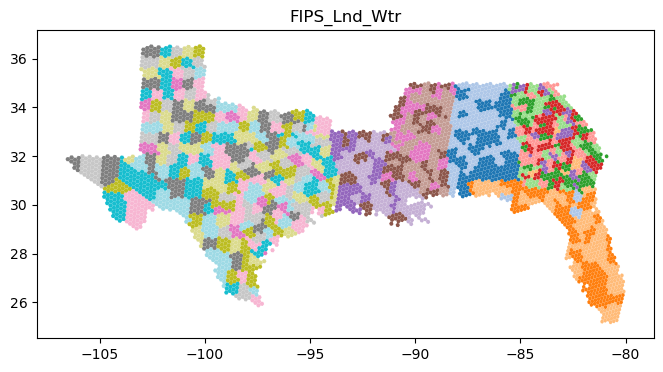

In [133]:
gdf['geometry']=gdf['hex_poly']
for field in field_names:
    gdf.plot(field,figsize=(20,4),cmap='tab20')
    plt.title(field)
    plt.show()

### now time it with further parallelization

In [134]:
# fresh gdf
gdf=gpd.GeoDataFrame(pd.concat(result_list,ignore_index=True))
gdf.set_crs('epsg:4326',inplace=True)

# set up the polygons and points in separate columns
# and make geometry column points
gdf['hex_poly']=gdf['geometry']
gdf['hex_point'] = gpd.points_from_xy(gdf['lon'], gdf['lat'])
gdf['geometry']=gdf['hex_point']
gdf.head()

C:\Users\kerrie\AppData\Local\Temp\ipykernel_3828\2208429661.py:2: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  gdf=gpd.GeoDataFrame(pd.concat(result_list,ignore_index=True))


,hex5,lat,lon,geometry,hex_poly,hex_point
0,8526cb83fffffff,32.617811,-96.718828,POINT (-96.71883 32.61781),"POLYGON ((-96.67757 32.52958, -96.60910 32.602...",POINT (-96.71883 32.61781)
1,8526c87bfffffff,33.089394,-97.147136,POINT (-97.14714 33.08939),"POLYGON ((-97.10527 33.00135, -97.03663 33.074...",POINT (-97.14714 33.08939)
2,85446923fffffff,31.879565,-96.173290,POINT (-96.17329 31.87957),"POLYGON ((-96.13284 31.79109, -96.06468 31.863...",POINT (-96.17329 31.87957)
3,85489a53fffffff,30.956948,-96.662193,POINT (-96.66219 30.95695),"POLYGON ((-96.62158 30.86829, -96.55408 30.941...",POINT (-96.66219 30.95695)
4,854893d7fffffff,28.811590,-96.196070,POINT (-96.19607 28.81159),"POLYGON ((-96.15665 28.72259, -96.09026 28.796...",POINT (-96.19607 28.81159)


In [135]:
%%time
# parallelization, ~48s

task_list=[dask.delayed(area_data_to_hexes)(gdf,layer) for layer in gdb_layer_inputs]

result_list=dask.compute(*task_list)

for result in result_list:
        print(result.shape)

(5378, 12)
(5378, 8)
(5378, 7)
(5378, 7)
(5378, 8)
CPU times: total: 47.4 s
Wall time: 44.4 s


In [ ]:
# this returns a dictionary of info about the shape that includes
# the shape type (polygon) and x,y coordinates of the polygon nodes 
# returned as a tuple of tuples ((x,y),(x,y),...)

# shapely.geometry.mapping(region_union.geoms[1])

In [ ]:
# # this returns a dictionary of info about the shapes that includes
# # the shape type (polygon) and x,y coordinates of the polygon nodes  
# # which are returned as a tuple of tuples ((x,y),(x,y),...)
# temp  = shapely.geometry.mapping(region_union.geoms[0])

# # reorganize the node coordinates into a list(list( (y,x) tuples))
# # why does it need so much nesting? no idea, maybe just the formatting of shapely .mapping
# temp['coordinates']=[[ (y,x) for x,y in temp['coordinates'][0] ]]

# temp

# # for x,y in temp['coordinates'][0]:
# #     print(x,y)
# #     print(z)

In [ ]:
# temp['coordinates'][0]

In [ ]:
# %%time
# hexsize = 5
# hex_list = h3.polyfill(temp,hexsize)
# # hex_list

In [ ]:
# %%time
# # create hex dataframe
# hex_col = 'hex{}'.format(hexsize)
# dfh = pd.DataFrame(hex_list,columns=[hex_col])
# print('Sanity Check\nnumber of hexes:', len(hex_list))
# print('number of duplicates:', len(hex_list) - len(dfh.drop_duplicates()))

# # add lat & lng of center of hex 
# dfh['lat']=dfh[hex_col].apply(lambda x: h3.h3_to_geo(x)[0])
# dfh['lon']=dfh[hex_col].apply(lambda x: h3.h3_to_geo(x)[1])

# # create Point object based on hex lat lon
# dfh['geometry'] = dfh.apply(lambda x: shapely.geometry.Point(x.lon,x.lat),1)

# dfh

In [ ]:
# h3.polyfill does not have an integrated parallelization option
# we need to manually parallelize by dividing the large polygon into multiple piece that don't overlap
# we'll divide into vertical strips

# from shapely.ops import split
# pt = Point((1, 1))
# line = LineString([(0,0), (2,2)])
# result = split(line, pt)

# poly=region_union.geoms[0]
# line=shapely.LineString([(-90,45),(-90,15)])
# sub_polys=shapely.ops.split(poly,line)
# sub_polys

In [ ]:
# split the polygon into strips that don't overlap
# the number of strips/new polygons is approximately equal to nchunks
subpolys=shapely.ops.split(poly,line)
subpolys

In [ ]:
# subpolys.geoms[4]
# shapely.geometry.mapping(subpolys.geoms[4])

In [ ]:
def create_h3grid(hexsize,poly,seg_ind):
    # h3 uses coordinates in the order (y,x), the opposite of shapely
    # get polygon coordinates and reverse order to (y,x)
    temp  = shapely.geometry.mapping(poly)
    temp['coordinates']=[[ (y,x) for x,y in temp['coordinates'][0] ]]

    # fill polygon with hexes
    hex_list = h3.polyfill(temp,hexsize)
    # hex_list=h3.polygonToCells(temp,hexsize) # v4

    # create dataframe with hex id 
    colname='hex{}'.format(hexsize)
    dfh = pd.DataFrame(hex_list,columns=[colname])
    # dfh=dfh.assign(segment_index=seg_ind) # for testing
    print('number of duplicates:', len(hex_list) - len(dfh.drop_duplicates()))


    # create Point object based on hex center lat lon
    dfh['lat']=dfh[colname].apply(lambda x: h3.h3_to_geo(x)[0])
    dfh['lon']=dfh[colname].apply(lambda x: h3.h3_to_geo(x)[1])

    # switch hexes back to x,y and create shapely polygon geometry column
    dfh['geometry']=dfh[colname].apply(lambda p: shapely.geometry.Polygon([(x,y) for y,x in h3.h3_to_geo_boundary(p)]))                            

    return dfh


In [ ]:
# # for i,subpoly in enumerate(subpolys.geoms)
# len(list(subpolys.geoms))

In [ ]:
task_list=[dask.delayed(create_h3grid)(8,subpoly,i) for i,subpoly in enumerate(subpolys.geoms)]
len(task_list)

In [ ]:
%%time
result_list=dask.compute(*task_list)

result_list[0]

In [ ]:
gdf=gpd.GeoDataFrame(pd.concat(result_list,ignore_index=True))
gdf.set_crs('epsg:4326',inplace=True)
gdf

In [ ]:
# gdf_subset=gdf[(gdf['lon']>-105)&(gdf['lon']<-104)&(gdf['lat']<30.5)]
len(pd.unique(gdf['hex8']))

In [ ]:
# gdf_subset.plot(figsize=(20,10))
gdf.plot(figsize=(20,10))

In [ ]:
gdf.crs

# now that we have the grid, put data on it

In [ ]:
gdf_joined = gpd.tools.sjoin(gdf, counties, how="inner")
gdf_joined.sample(3)

In [ ]:
gdf_joined.plot("COUNTY_FP",figsize=(20,10),cmap='tab20')

In [ ]:
subset=gdf_joined[(gdf_joined['lon']>-103)&(gdf_joined['lon']<-102.5)&(gdf_joined['lat']>32.25)&(gdf_joined['lat']<32.75)]
subset.plot("COUNTY_FP",figsize=(20,10),cmap='tab20')

looks like some hexes are assigned to multiple counties

i think what's happening is since the geometry in the gdf is polygon, the data join is doing a polygon to polygon overlap. i would need to change the geometry column in the gdf to points for the join to use the hex center points and county polygons

let's try again...

In [ ]:
# geopandas allows for only 1 geometry column at a time
# so rename first and then create new one filled with points
gdf.rename(columns={'geometry':'hex_poly'},inplace=True)
gdf['geometry'] = gpd.points_from_xy(gdf['lon'], gdf['lat'])
gdf.set_crs('epsg:4326',inplace=True)
gdf

In [ ]:
# do the join
gdf_joined = gpd.tools.sjoin(gdf, counties, how="inner")

In [ ]:
# now to plot the hexagons we need to name the hex_poly column geometry
gdf_joined.rename(columns={'geometry':'hex_points','hex_poly':'geometry'},inplace=True)

gdf_joined.plot("COUNTY_FP",figsize=(20,10),cmap='tab20')

In [ ]:
subset=gdf_joined[(gdf_joined['lon']>-103)&(gdf_joined['lon']<-102.5)&(gdf_joined['lat']>32.25)&(gdf_joined['lat']<32.75)]
subset.plot("COUNTY_FP",figsize=(20,10),cmap='tab20')

ok, so it works but it's a little wonky and cumbersome

I will checkout h3pandas to see if the process is more streamlined

The hex layer reference inputs were calculated based on Spatial Join with the "Have their center in" match option.

https://pro.arcgis.com/en/pro-app/latest/tool-reference/analysis/spatial-join.htm
arcpy.analysis.SpatialJoin(target_features, join_features, out_feature_class, {join_operation}, {join_type}, {field_mapping}, {match_option}, {search_radius}, {distance_field_name}, {match_fields})

See also: "K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3_Grid_tb_attrbts.docx" 

 ### Step 1. Adding state and county boundary fields

In [ ]:
# # Step 1. Add state and county boundary fields to H3_5 grid, Spatial Join with "Have Their Center IN" option.

# import arcpy
# arcpy.analysis.SpatialJoin(
#     target_features=r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\H3_5",
#     join_features=r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3Grid_Inputs.gdb\Inputs\tj_2021_us_st_cnt",
#     out_feature_class=r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty",
#     join_operation="JOIN_ONE_TO_ONE",
#     join_type="KEEP_ALL",
#     field_mapping=r'GRID_ID "GRID_ID" true true false 17 Text 0 0,First,#,'
#                   r'target_features,'
#                   r'GRID_ID,0,17;Shape_Length "Shape_Length" false true true 8 Double 0 0,First,#,'
#                   r'target_features,'
#                   r'Shape_Length,-1,-1;Shape_Area "Shape_Area" false true true 8 Double 0 0,First,#,'
#                   r'target_features,'
#                   r'Shape_Area,-1,-1;STATE_FP "STATE_FP" true true false 2 Text 0 0,First,#,'
#                   r'join_features,'
#                   r'STATE_FP,0,2;STATE_AB "STATE_AB" true true false 2 Text 0 0,First,#,'
#                   r'join_features,'
#                   r'STATE_AB,0,2;STATE_NM "STATE_NM" true true false 15 Text 0 0,First,#,'
#                   r'join_features,'
#                   r'STATE_NM,0,15;COUNTY_FP "COUNTY_FP" true true false 3 Text 0 0,First,#,'
#                   r'join_features,'
#                   r'COUNTY_FP,0,3;CNTY_NAME "CNTY_NAME" true true false 25 Text 0 0,First,#,'
#                   r'join_features,'
#                   r'CNTY_NAME,0,25;GEO_ID "GEO_ID" true true false 5 Text 0 0,First,#,'
#                   r'join_features,'
#                   r'GEO_ID,0,5',
#     match_option="HAVE_THEIR_CENTER_IN",
#     search_radius=None,
#     distance_field_name=""
# )
# # The DeleteField function is used to remove the extra fields created during the join.
# arcpy.management.DeleteField(
#     in_table= r"K:\projects\rgmg\\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty",
#     drop_field="Join_Count;TARGET_FID",
#     method="DELETE_FIELDS"
# )


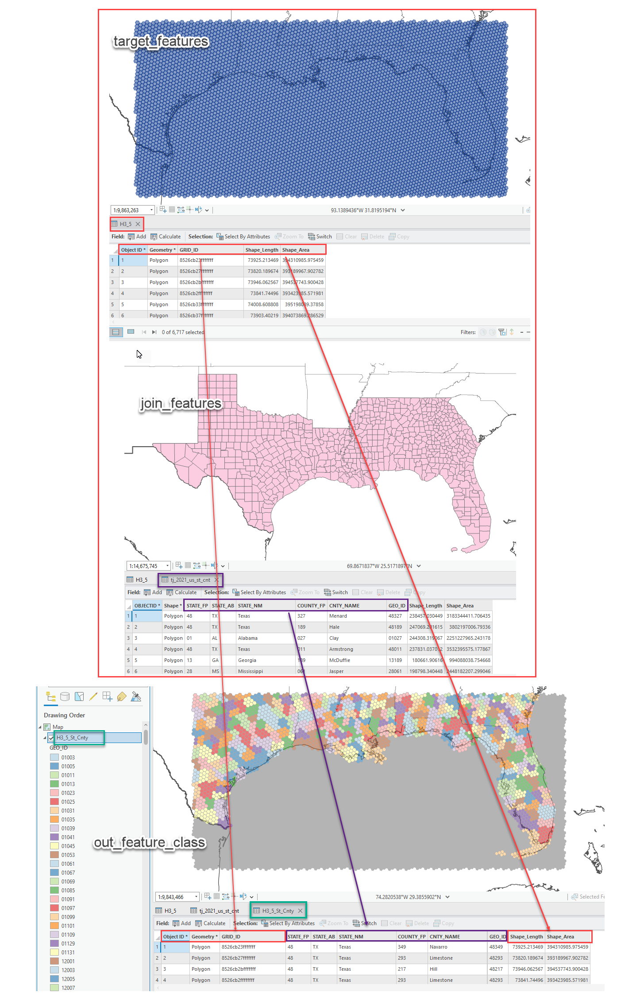

 ### Step 2. Adding estuarine drainage fields

In [ ]:
# # Step 2. Add estuarine drainage area attributes; target_features file is the output from step 1. 


# arcpy.analysis.SpatialJoin(
#     target_features=r"K:\projects\rgmg\\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty",
#     join_features= r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3Grid_Inputs.gdb\Inputs\Estuarine_Drainage_Areas",
#     out_feature_class=r"K:\projects\rgmg\\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA",
#     join_operation="JOIN_ONE_TO_ONE",
#     join_type="KEEP_ALL",
#     field_mapping='GRID_ID "GRID_ID" true true false 17 Text 0 0,First,#,H3_5_St_Cnty,'
#                   'GRID_ID,0,17;STATE_FP "STATE_FP" true true false 2 Text 0 0,First,#,'
#                   'target_features,STATE_FP,0,2;STATE_AB "STATE_AB" true true false 2 Text 0 0,First,#,'
#                   'target_features,STATE_AB,0,2;STATE_NM "STATE_NM" true true false 15 Text 0 0,First,#,'
#                   'target_features,STATE_NM,0,15;COUNTY_FP "COUNTY_FP" true true false 3 Text 0 0,First,#,'
#                   'target_features,COUNTY_FP,0,3;CNTY_NAME "CNTY_NAME" true true false 25 Text 0 0,First,#,'
#                   'target_features,CNTY_NAME,0,25;GEO_ID "GEO_ID" true true false 5 Text 0 0,First,#,'
#                   'target_features,GEO_ID,0,5;EDA_ID "EDA_ID" true true false 3 Text 0 0,First,#,'
#                   'join_features,EDA_ID,0,3;EDA_NAME "EDA_NAME" true true false 100 Text 0 0,First,#,'
#                   'join_features,EDA_NAME,0,100',
#     match_option="HAVE_THEIR_CENTER_IN",
#     search_radius=None,
#     distance_field_name=""
# )
# # The DeleteField function is used to remove the extra fields created during the join.
# arcpy.management.DeleteField(
#     in_table=r"K:\projects\rgmg\\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA",
#     drop_field="Join_Count;TARGET_FID",
#     method="DELETE_FIELDS"
# )

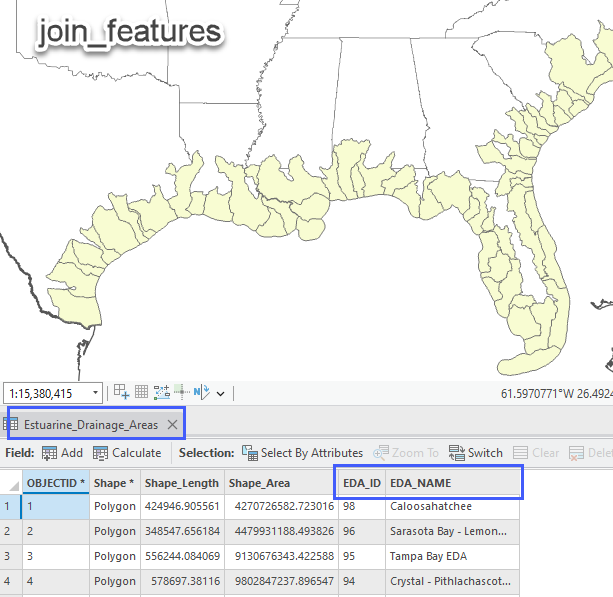

 ### Step 3. Adding 8-digit hydrologic unit codes

In [ ]:
# # Step 3. Add 8-digit hydrologic unit codes; target_features file is the output from step 2.

# arcpy.analysis.SpatialJoin(
#     target_features=r"K:\projects\rgmg\\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA",
#     join_features=r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3Grid_Inputs.gdb\Inputs\WBDHU8",
#     out_feature_class=r"K:\projects\rgmg\\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA_WB8",
#     join_operation="JOIN_ONE_TO_ONE",
#     join_type="KEEP_ALL",
#     field_mapping='GRID_ID "GRID_ID" true true false 17 Text 0 0,First,#,H3_5_St_Cnty_EDA,'
#                   'GRID_ID,0,17;STATE_FP "STATE_FP" true true false 2 Text 0 0,First,#,target_features,'
#                   'STATE_FP,0,2;STATE_AB "STATE_AB" true true false 2 Text 0 0,First,#,target_features,'
#                   'STATE_AB,0,2;STATE_NM "STATE_NM" true true false 15 Text 0 0,First,#,target_features,'
#                   'STATE_NM,0,15;COUNTY_FP "COUNTY_FP" true true false 3 Text 0 0,First,#,target_features,'
#                   'COUNTY_FP,0,3;CNTY_NAME "CNTY_NAME" true true false 25 Text 0 0,First,#,target_features,'
#                   'CNTY_NAME,0,25;GEO_ID "GEO_ID" true true false 5 Text 0 0,First,#,target_features,'
#                   'GEO_ID,0,5;EDA_ID "EDA_ID" true true false 3 Text 0 0,First,#,target_features,'
#                   'EDA_ID,0,3;EDA_NAME "EDA_NAME" true true false 100 Text 0 0,First,#,target_features,'
#                   'EDA_NAME,0,100;Shape_Length "Shape_Length" false true true 8 Double 0 0,First,#,target_features,'
#                   'Shape_Length,-1,-1;Shape_Area "Shape_Area" false true true 8 Double 0 0,First,#,target_features,'
#                   'Shape_Area,-1,-1;HUC_8 "HUC_8" true true false 8 Text 0 0,First,#,join_feature,HUC_8,0,8',
#     match_option="HAVE_THEIR_CENTER_IN",
#     search_radius=None,
#     distance_field_name=""
# )
# # The DeleteField function is used to remove the extra fields created during the join.
# arcpy.management.DeleteField(
#     in_table=r"K:\projects\rgmg\\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA_WB8",
#     drop_field="Join_Count;TARGET_FID",
#     method="DELETE_FIELDS"
# )

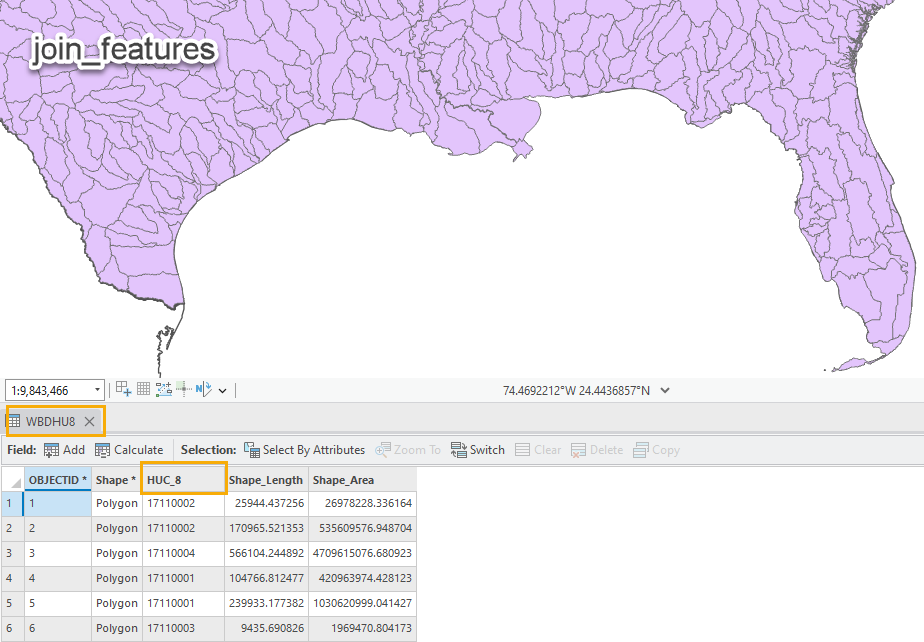

 ### Step 4. Adding 12-digit hydrologic unit codes

In [ ]:
# # Step 4. Add 12-digit hydrologic unit codes; target_features file is the output from step 3.

# arcpy.analysis.SpatialJoin(
#     target_features=r"K:\projects\rgmg\\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA_WB8",
#     join_features=r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3Grid_Inputs.gdb\Inputs\WBDHU12",
#     out_feature_class=r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA_WB8_WB12",
#     join_operation="JOIN_ONE_TO_ONE",
#     join_type="KEEP_ALL",
#     field_mapping='GRID_ID "GRID_ID" true true false 17 Text 0 0,First,#,target_features,' 
#                   'GRID_ID,0,17;STATE_FP "STATE_FP" true true false 2 Text 0 0,First,#,target_features,' 
#                   'STATE_FP,0,2;STATE_AB "STATE_AB" true true false 2 Text 0 0,First,#,target_features,' 
#                   'STATE_AB,0,2;STATE_NM "STATE_NM" true true false 15 Text 0 0,First,#,target_features,' 
#                   'STATE_NM,0,15;COUNTY_FP "COUNTY_FP" true true false 3 Text 0 0,First,#,target_features,' 
#                   'COUNTY_FP,0,3;CNTY_NAME "CNTY_NAME" true true false 25 Text 0 0,First,#,target_features,' 
#                   'CNTY_NAME,0,25;GEO_ID "GEO_ID" true true false 5 Text 0 0,First,#,target_features,' 
#                   'GEO_ID,0,5;EDA_ID "EDA_ID" true true false 3 Text 0 0,First,#,target_features,' 
#                   'EDA_ID,0,3;EDA_NAME "EDA_NAME" true true false 100 Text 0 0,First,#,target_features,' 
#                   'EDA_NAME,0,100;HUC_8 "HUC_8" true true false 8 Text 0 0,First,#,target_features,' 
#                   'HUC_8,0,8;Shape_Length "Shape_Length" false true true 8 Double 0 0,First,#,target_features,' 
#                   'Shape_Length,-1,-1;Shape_Area "Shape_Area" false true true 8 Double 0 0,First,#,target_features,' 
#                   'Shape_Area,-1,-1;HUC_12 "HUC_12" true true false 12 Text 0 0,First,#,join_features,HUC_12,0,12',
#     match_option="HAVE_THEIR_CENTER_IN",
#     search_radius=None,
#     distance_field_name=""
# )
# # The DeleteField function is used to remove the extra fields created during the join.
# arcpy.management.DeleteField(
#     in_table=r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA_WB8_WB12",
#     drop_field="Join_Count;TARGET_FID",
#     method="DELETE_FIELDS"
# )

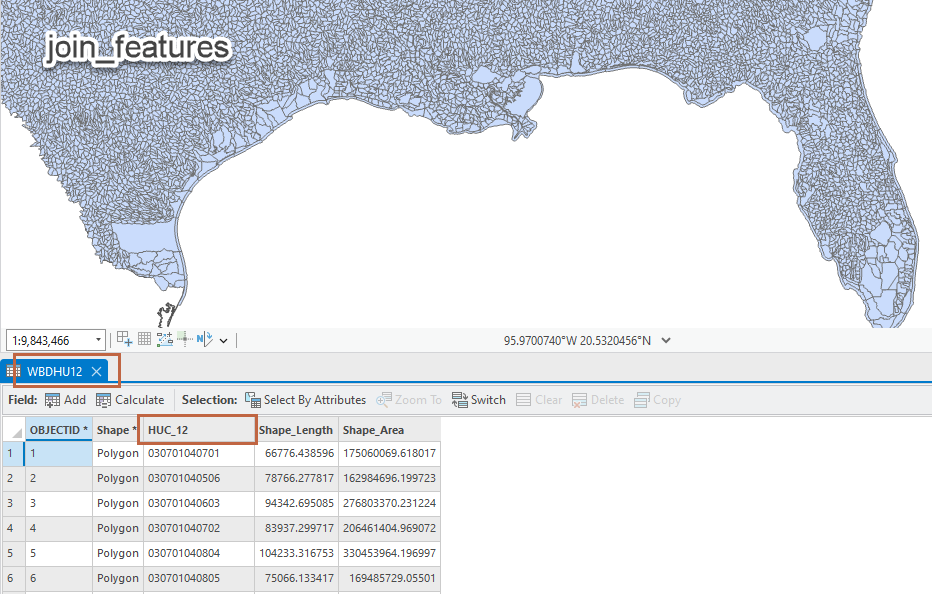

### Step 5. Adding land/water and population density information

In [ ]:
# # Step 5. Add FIPS_Lnd_Wtr and POP_SQMI fields, target_features file is the output from step 4.
# # This step calculates the population density and GEOID_Land (inside of the land area in the US counties)

# arcpy.analysis.SpatialJoin(
#     target_features=r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA_WB8_WB12",
#     join_features=r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3Grid_Inputs.gdb\Inputs\dtl_cnty_Census_ESRI",
#     out_feature_class=r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA_WB8_WB12_Lnd_Wtr",
#     join_operation="JOIN_ONE_TO_ONE",
#     join_type="KEEP_ALL",
#     field_mapping='GRID_ID "GRID_ID" true true false 17 Text 0 0,First,#,target_features,'
#                   'GRID_ID,0,17;STATE_FP "STATE_FP" true true false 2 Text 0 0,First,#,target_features,'
#                   'STATE_FP,0,2;STATE_AB "STATE_AB" true true false 2 Text 0 0,First,#,target_features,'
#                   'STATE_AB,0,2;STATE_NM "STATE_NM" true true false 15 Text 0 0,First,#,target_features,'
#                   'STATE_NM,0,15;COUNTY_FP "COUNTY_FP" true true false 3 Text 0 0,First,#,target_features,'
#                   'COUNTY_FP,0,3;CNTY_NAME "CNTY_NAME" true true false 25 Text 0 0,First,#,target_features,'
#                   'CNTY_NAME,0,25;GEO_ID "GEO_ID" true true false 5 Text 0 0,First,#,target_features,'
#                   'GEO_ID,0,5;EDA_ID "EDA_ID" true true false 3 Text 0 0,First,#,target_features,'
#                   'EDA_ID,0,3;EDA_NAME "EDA_NAME" true true false 100 Text 0 0,First,#,target_features,'
#                   'EDA_NAME,0,100;HUC_8 "HUC_8" true true false 8 Text 0 0,First,#,target_features,'
#                   'HUC_8,0,8;HUC_12 "HUC_12" true true false 12 Text 0 0,First,#,target_features,'
#                   'HUC_12,0,12;Shape_Length "Shape_Length" false true true 8 Double 0 0,First,#,target_features,'
#                   'Shape_Length,-1,-1;Shape_Area "Shape_Area" false true true 8 Double 0 0,First,#,target_features,'
#                   'Shape_Area,-1,-1;POP_SQMI "POP_SQMI" true true false 8 Double 0 0,First,#,'
#                   'join_features,POP_SQMI,-1,-1;FIPS_Lnd_Wtr "FIPS_Land_Wtr" true true false 15 Text 0 0,First,#,'
#                   'join_features,FIPS_Lnd_Wtr,0,15',
#     match_option="HAVE_THEIR_CENTER_IN",
#     search_radius=None,
#     distance_field_name=""
# )
# # The DeleteField function is used to remove the extra fields created during the join.
# arcpy.management.DeleteField(
#     in_table=r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA_WB8_WB12_Lnd_Wtr",
#     drop_field="Join_Count;TARGET_FID",
#     method="DELETE_FIELDS"
# )
# # replace the null values for 'GEO_ID' and 'FIPS_Lnd_Wtr' fields with "" 
# # the null values create problems for the field calculation operation 

# path = r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA_WB8_WB12_Lnd_Wtr"

# fieldNames = ['GEO_ID','FIPS_Lnd_Wtr']  
# fieldCount = len(fieldNames)  

# with arcpy.da.UpdateCursor(path, fieldNames) as curU:  
#     for row in curU:  
#         rowU = row  
#         for field in range(fieldCount):  
#             if rowU[field] == None:  
#                 rowU[field] = ""  
      
      
#         curU.updateRow(rowU)

# del curU

# # The CalculateField function is used to complete the 'FIPS_Lnd_Wtr' field
# # The attributes "GEOID_Water" and "Water" are calculated based on the already existing GEO_ID and FIPS_Lnd_Wtr attributes
# arcpy.management.CalculateField(
#     in_table=r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA_WB8_WB12_Lnd_Wtr",
#     field="FIPS_Lnd_Wtr",
#     expression="attr(!GEO_ID!, !FIPS_Lnd_Wtr!)",
#     expression_type="PYTHON3",
#     code_block="""def attr(GEO_ID, FIPS_Lnd_Wtr):
#     if FIPS_Lnd_Wtr != "":
#          return FIPS_Lnd_Wtr
#     if FIPS_Lnd_Wtr == "" and GEO_ID != "":
#         return GEO_ID + "_Water"
#     if FIPS_Lnd_Wtr == "" and GEO_ID == "":
#         return "Water" """,
#     field_type="TEXT",
#     enforce_domains="NO_ENFORCE_DOMAINS"
# )

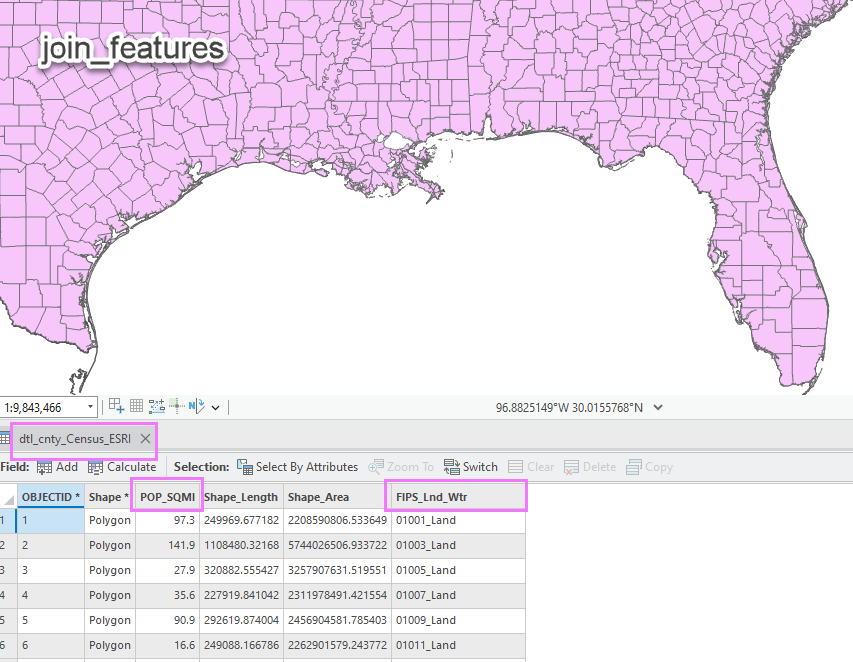

### Step 6. Replacing the null values with "" (for the text fields) and -999 (for the population density field). Exporting the final output layer

In [ ]:
# # replace the "null" values for text fields with "" 
# path = r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA_WB8_WB12_Lnd_Wtr"

# fieldTxt = ['STATE_FP','STATE_AB','STATE_NM','COUNTY_FP', 'CNTY_NAME', 'EDA_ID', 'EDA_NAME', 'HUC_8', 'HUC_12', 'FIPS_Lnd_Wtr'] 
# fieldTxtCount = len(fieldTxt)  

# with arcpy.da.UpdateCursor(path, fieldTxt) as curU:  
#     for row in curU:  
#         rowU = row  
#         for field in range(fieldTxtCount):  
#             if rowU[field] == None:  
#                 rowU[field] = ""  
      
      
#         curU.updateRow(rowU)

# del curU

# # replace the "null" values for the POP_SQMI field with -999
# fieldDb = ['POP_SQMI']  
# fieldDbCount = len(fieldDb)  

# with arcpy.da.UpdateCursor(path, fieldDb) as curU:  
#     for row in curU:  
#         rowU = row  
#         for field in range(fieldDbCount):  
#             if rowU[field] == None:  
#                 rowU[field] = -999  
      
      
#         curU.updateRow(rowU)

# del curU

# # export the H3 layer with reference attributes to the permanent feature dataset
# arcpy.conversion.ExportFeatures(
#     in_features=r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\Temp\H3_5_St_Cnty_EDA_WB8_WB12_Lnd_Wtr",
#     out_features=r"K:\projects\rgmg\MSGeoProject\Projects\Grid_Effort\H3_5_10_Grd.gdb\H3_Grds_Reference_Flds\H3_5_ref_flds",
#     where_clause="",
#     use_field_alias_as_name="NOT_USE_ALIAS",
#     field_mapping='GRID_ID "GRID_ID" true true false 17 Text 0 0,First,#, in_features,'
#                   'GRID_ID,0,17;STATE_FP "STATE_FP" true true false 2 Text 0 0,First,#,in_features,'
#                   'STATE_FP,0,2;STATE_AB "STATE_AB" true true false 2 Text 0 0,First,#,in_features,'
#                   'STATE_AB,0,2;STATE_NM "STATE_NM" true true false 15 Text 0 0,First,#,in_features,'
#                   'STATE_NM,0,15;COUNTY_FP "COUNTY_FP" true true false 3 Text 0 0,First,#,in_features,'
#                   'COUNTY_FP,0,3;CNTY_NAME "CNTY_NAME" true true false 25 Text 0 0,First,#,in_features,'
#                   'CNTY_NAME,0,25;GEO_ID "GEO_ID" true true false 5 Text 0 0,First,#,in_features,'
#                   'GEO_ID,0,5;EDA_ID "EDA_ID" true true false 3 Text 0 0,First,#,in_features,'
#                   'EDA_ID,0,3;EDA_NAME "EDA_NAME" true true false 100 Text 0 0,First,#,in_features,'
#                   'EDA_NAME,0,100;HUC_8 "HUC_8" true true false 8 Text 0 0,First,#,in_features,'
#                   'HUC_8,0,8;HUC_12 "HUC_12" true true false 12 Text 0 0,First,#,in_features,'
#                   'HUC_12,0,12;POP_SQMI "POP_SQMI" true true false 8 Double 0 0,First,#,in_features,'
#                   'POP_SQMI,-1,-1;FIPS_Lnd_Wtr "FIPS_Land_Wtr" true true false 15 Text 0 0,First,#,in_features,'
#                   'FIPS_Lnd_Wtr,0,15;Shape_Length "Shape_Length" false true true 8 Double 0 0,First,#,in_features,'
#                   'Shape_Length,-1,-1;Shape_Area "Shape_Area" false true true 8 Double 0 0,First,#,in_features,Shape_Area,-1,-1',
#     sort_field=None
# )


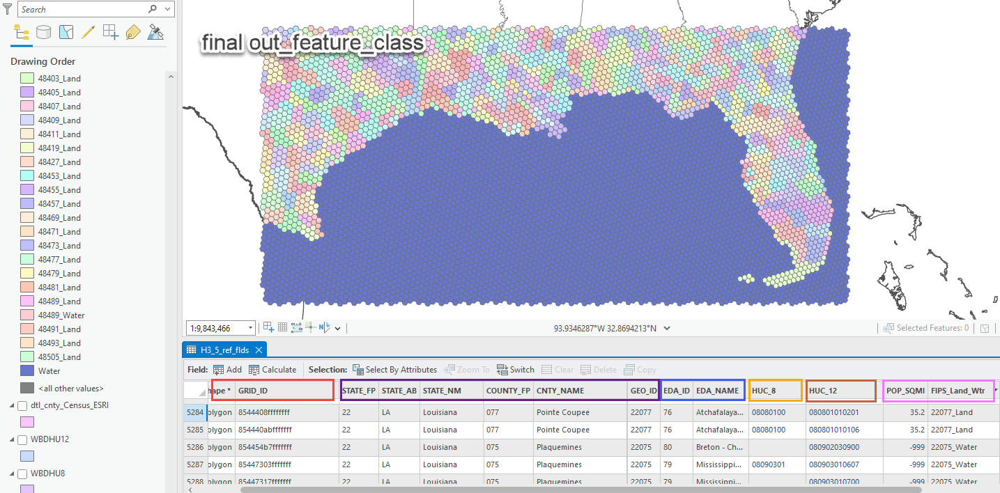